In [8]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from matplotlib import cm
import ast
from collections import Counter
import itertools
import math

In [9]:
df = pd.read_csv('CLEAN_DATA.csv')
print(df.shape)
df.head()

(5964, 40)


,Unnamed: 0,file,county_x,labels,label_scores,colors,color_pixel_fraction,color_scores,chunk,chunk_index,...,TRACT,CENTLON,AREALAND,INTPTLON,MTFCC,COUNTY,CENT,INTPT,Census_Benchmark,Census_Vintage
0,0,/Volumes/Cooper_TB_Drive/research/readmissions...,Washtenaw,"['White', 'Black', 'Line']","[0.9736676812171936, 0.9484156370162964, 0.787...","[(255, 255, 255)]",[1.0],[1.0],1,0,...,732100,-84.083245,87423741,-84.074565,G5020,93,"(-84.0832452, 42.4668888)","(-84.074565, 42.4719749)",Public_AR_Current,ACS2015_Current
1,1,/Volumes/Cooper_TB_Drive/research/readmissions...,Washtenaw,"['White', 'Black', 'Line']","[0.9736676812171936, 0.9484156370162964, 0.787...","[(255, 255, 255)]",[1.0],[1.0],1,1,...,732100,-84.083245,87423741,-84.074565,G5020,93,"(-84.0832452, 42.4668888)","(-84.074565, 42.4719749)",Public_AR_Current,ACS2015_Current
2,2,/Volumes/Cooper_TB_Drive/research/readmissions...,Washtenaw,"['White', 'Black', 'Line']","[0.9736676812171936, 0.9484156370162964, 0.787...","[(255, 255, 255)]",[1.0],[1.0],1,10,...,732100,-84.083245,87423741,-84.074565,G5020,93,"(-84.0832452, 42.4668888)","(-84.074565, 42.4719749)",Public_AR_Current,ACS2015_Current
3,3,/Volumes/Cooper_TB_Drive/research/readmissions...,Washtenaw,"['White', 'Black', 'Line']","[0.9736676812171936, 0.9484156370162964, 0.787...","[(255, 255, 255)]",[1.0],[1.0],1,100,...,733601,-83.980353,30603912,-83.980535,G5020,93,"(-83.9803529, 42.4429685)","(-83.980535, 42.4443155)",Public_AR_Current,ACS2015_Current
4,4,/Volumes/Cooper_TB_Drive/research/readmissions...,Washtenaw,"['White', 'Black', 'Line']","[0.9736676812171936, 0.9484156370162964, 0.787...","[(255, 255, 255)]",[1.0],[1.0],1,101,...,733601,-83.980353,30603912,-83.980535,G5020,93,"(-83.9803529, 42.4429685)","(-83.980535, 42.4443155)",Public_AR_Current,ACS2015_Current


In [10]:
df.columns

Index(['Unnamed: 0', 'file', 'county_x', 'labels', 'label_scores', 'colors',
       'color_pixel_fraction', 'color_scores', 'chunk', 'chunk_index',
       'image_index', 'latitiude', 'longitude', 'projection', 'resolution',
       'metadata', 'county_y', 'window_size', 'chunk_file', 'GEOID', 'CENTLAT',
       'AREAWATER', 'STATE', 'BASENAME', 'OID', 'LSADC', 'FUNCSTAT',
       'INTPTLAT', 'NAME', 'OBJECTID', 'TRACT', 'CENTLON', 'AREALAND',
       'INTPTLON', 'MTFCC', 'COUNTY', 'CENT', 'INTPT', 'Census_Benchmark',
       'Census_Vintage'],
      dtype='object')

In [11]:
def build_fig(size=(4, 4), dpi=200, axis_off=True):
    """A function to build a matplotlib figure. Primary
    goal is to sandardize the easy stuff.
    Args:
        - title (str): the title of the plot
        - axis_off (bool): should the axis be printed?
        - size (tuple): how big should the plot be?
        - y_lab (str): y axis label
        - x_lab (str): x axis label
    Returns:
        fig (plt.figure)
    """
    fig = plt.figure(figsize=size, 
                    facecolor='w',
                    dpi=dpi)

    if axis_off:
        plt.axis('off')
    return fig

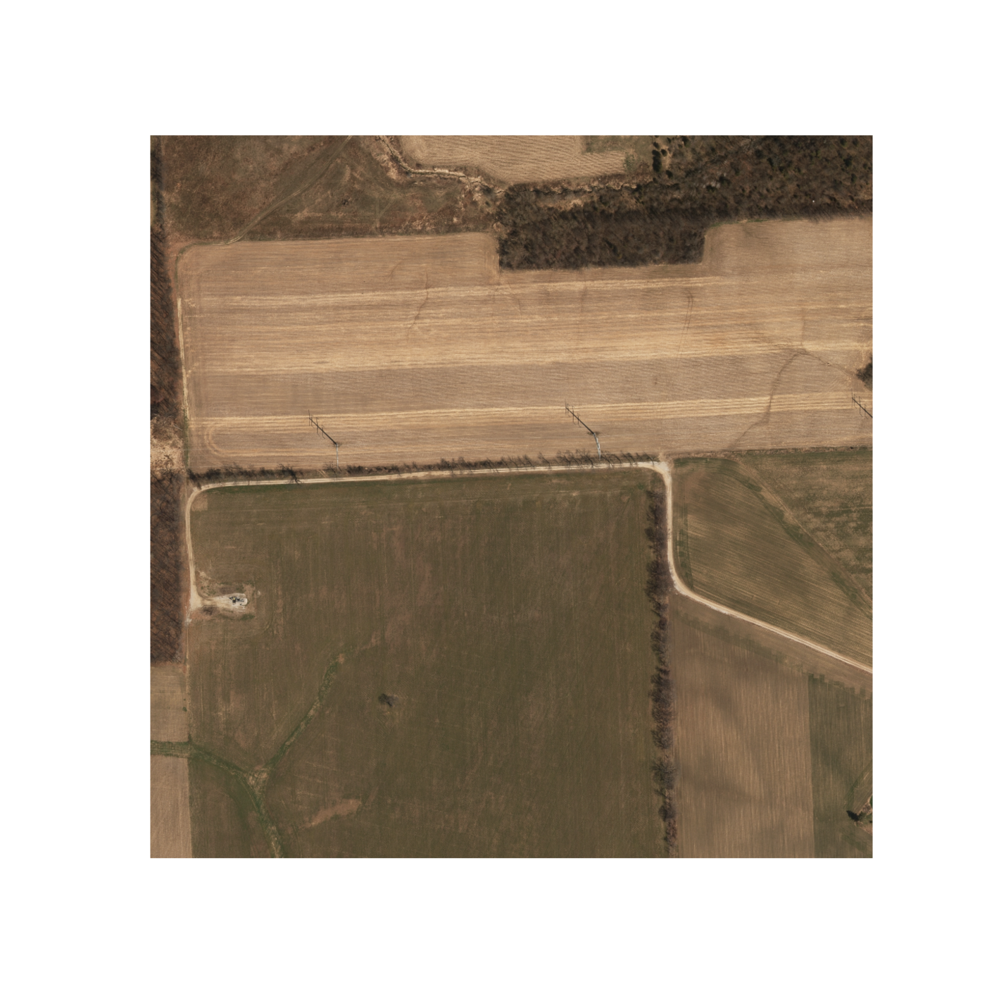

In [24]:
"""
A few sanity checks
"""

test = df.sample(1)
lat = test['latitiude'].values[0]
lon = test['longitude'].values[0]
f_path = test['file'].values[0]

labels = ast.literal_eval(test['labels'].values[0])
fracs = ast.literal_eval(test['color_pixel_fraction'].values[0])
fracs = [np.round(i, 3) for i in fracs]

colors = ast.literal_eval(test['colors'].values[0])

normed_cols = []
for idx, tup in enumerate(colors):
    new_tup = np.array(tup).astype(float) / 255.0
    normed_cols.append(tuple(new_tup))

# print(f"({lat:.3f}, {lon:.3f})")
# print(labels)
# fig, ax = plt.subplots(figsize=(4, 4), dpi=200)
# pie = ax.pie(fracs, colors=normed_cols, labels=fracs)

fig = build_fig(size=(6, 6), dpi=300)
plt.imshow(plt.imread(f_path)[:,:,:])

In [13]:
ast.literal_eval(test['label_scores'].values[0])

[0.7620207667350769,
 0.7313721776008606,
 0.7026467323303223,
 0.6545118689537048,
 0.6219013333320618,
 0.6002357602119446,
 0.5930580496788025,
 0.5905969142913818,
 0.5846935510635376,
 0.5766003131866455]

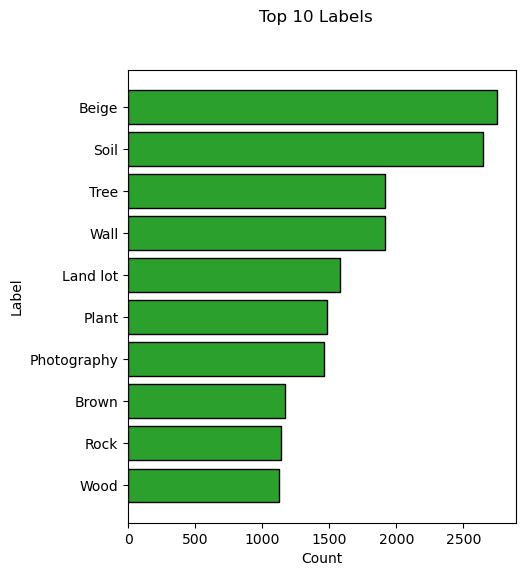

In [14]:
N_MOST_COMMON = 10
labels = df['labels'].apply(ast.literal_eval).to_list()
labels = list(itertools.chain.from_iterable(labels))
c = Counter(labels)
tmp = pd.DataFrame(c.most_common(N_MOST_COMMON))
tmp.columns = ['Label','Count']

fig = build_fig(size=(5, 6), dpi=100, axis_off=False)
plt.barh(y=tmp['Label'], width=tmp['Count'], color='C12', edgecolor='black')
plt.suptitle(f"Top {N_MOST_COMMON} Labels")
plt.xlabel('Count')
plt.ylabel('Label')
plt.gca().invert_yaxis()

11.180339887498949

In [15]:
# for tract in set(df['NAME']):
#     subset = df[df['NAME'] == tract]

#     N_MOST_COMMON = 10
#     labels = subset['labels'].apply(ast.literal_eval).to_list()
#     labels = list(itertools.chain.from_iterable(labels))
#     c = Counter(labels)
#     tmp = pd.DataFrame(c.most_common(N_MOST_COMMON))
#     tmp.columns = ['Label','Count']

#     fig = build_fig(size=(5, 6), dpi=100, axis_off=False)
#     plt.barh(y=tmp['Label'], width=tmp['Count'], color='C12', edgecolor='black')
#     plt.suptitle(f"Top {N_MOST_COMMON} Labels for {tract} ({len(subset)} images)")
#     plt.xlabel('Count')
#     plt.ylabel('Label')
#     plt.gca().invert_yaxis()
pass


CPU times: user 2.06 s, sys: 42.8 ms, total: 2.11 s
Wall time: 6.09 s


Text(0, 0.5, 'Longitude')

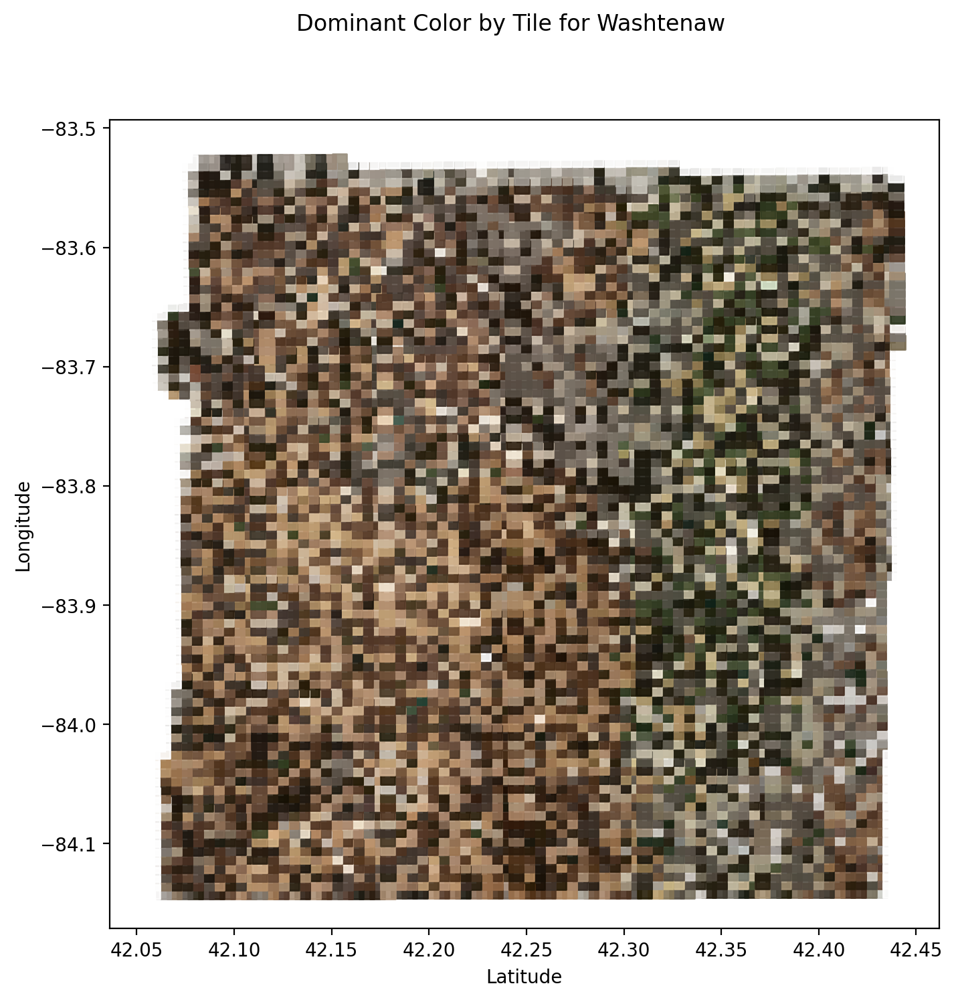

In [16]:
%%time

N_DOMINANT_COL = 8

dominant_colors = []

for idx, row in df.iterrows():
    colors = ast.literal_eval(row['colors'])

    if len(colors) > N_DOMINANT_COL:
        normed_dcolor = np.array(colors[N_DOMINANT_COL]).astype(float) / 255.0
    else:
        normed_dcolor = np.array([1.0, 1.0, 1.0])

    dominant_colors.append(normed_dcolor)


x = df['latitiude'].to_numpy()
y = df['longitude'].to_numpy()

fig = build_fig(size=(8, 8), dpi=200, axis_off=False)
plt.scatter(x, y, color=dominant_colors, s=60, marker="s", alpha=0.9)
plt.suptitle(f"Dominant Color by Tile for Washtenaw")
plt.xlabel('Latitude')
plt.ylabel('Longitude')

In [17]:
df.columns

Index(['Unnamed: 0', 'file', 'county_x', 'labels', 'label_scores', 'colors',
       'color_pixel_fraction', 'color_scores', 'chunk', 'chunk_index',
       'image_index', 'latitiude', 'longitude', 'projection', 'resolution',
       'metadata', 'county_y', 'window_size', 'chunk_file', 'GEOID', 'CENTLAT',
       'AREAWATER', 'STATE', 'BASENAME', 'OID', 'LSADC', 'FUNCSTAT',
       'INTPTLAT', 'NAME', 'OBJECTID', 'TRACT', 'CENTLON', 'AREALAND',
       'INTPTLON', 'MTFCC', 'COUNTY', 'CENT', 'INTPT', 'Census_Benchmark',
       'Census_Vintage'],
      dtype='object')

In [18]:
len(set(df['NAME']))

132

In [268]:
# %%time
    
# cmap = cm.get_cmap('rainbow')

# pop_arr = df['POP100'].to_numpy().astype(float)
# pop = (pop_arr / pop_arr.max())
# colors = [cmap(i) for i in pop]
# x = df['latitiude'].to_numpy()
# y = df['longitude'].to_numpy()


# fig = build_fig(size=(4, 4), dpi=200, axis_off=False)
# plt.scatter(x, y, color=colors, s=pop * 5, marker="o", alpha=0.8)
# plt.suptitle(f"Population by Tile for Washtenaw")
# plt.xlabel('Latitude')
# plt.xlabel('Longitude')

CPU times: user 554 ms, sys: 8.25 ms, total: 562 ms
Wall time: 698 ms


Text(0.5, 0, 'Longitude')

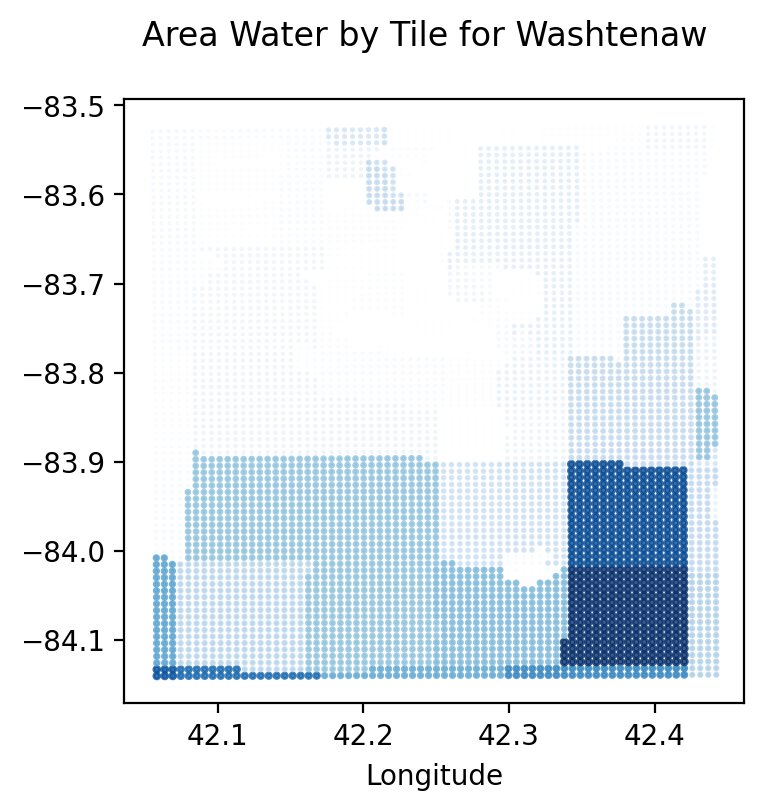

In [269]:
%%time
    
cmap = cm.get_cmap('Blues')

pop_arr = df['AREAWATER'].to_numpy().astype(float)
pop = (pop_arr / pop_arr.max())
colors = [cmap(i) for i in pop]
x = df['latitiude'].to_numpy()
y = df['longitude'].to_numpy()


fig = build_fig(size=(4, 4), dpi=200, axis_off=False)
plt.scatter(x, y, color=colors, s=pop * 5, marker="o", alpha=0.8)
plt.suptitle(f"Area Water by Tile for Washtenaw")
plt.xlabel('Latitude')
plt.xlabel('Longitude')

In [270]:
# %%time
    
# cmap = cm.get_cmap('PRGn')

# pop_arr = df['HU100'].to_numpy().astype(float)
# pop = (pop_arr / pop_arr.max())
# colors = [cmap(i) for i in pop]
# x = df['latitiude'].to_numpy()
# y = df['longitude'].to_numpy()


# fig = build_fig(size=(4, 4), dpi=200, axis_off=False)
# plt.scatter(x, y, color=colors, s=pop * 5, marker="o", alpha=0.8)
# plt.suptitle(f"Housing Units by Tile for Washtenaw")
# plt.xlabel('Latitude')
# plt.xlabel('Longitude')

In [271]:
tmp = pd.DataFrame(df['NAME'].value_counts())
tmp

,NAME
Census Tract 4320,772
Census Tract 4260,368
Census Tract 4310,266
Census Tract 4610,255
Census Tract 4480,242
...,...
Census Tract 4110,2
Census Tract 4107,2
Census Tract 4140,2
Census Tract 4042,1


CPU times: user 208 ms, sys: 4.32 ms, total: 212 ms
Wall time: 219 ms


Text(0.5, 0, 'Longitude')

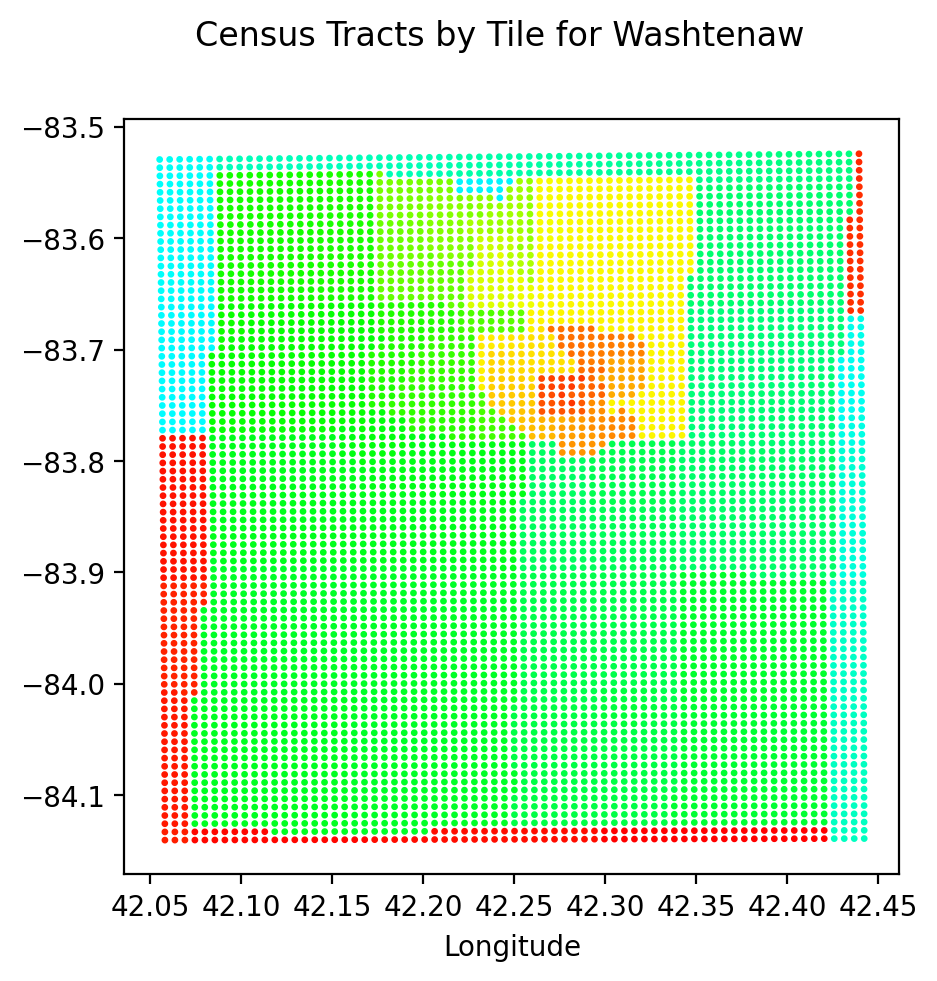

In [272]:

%%time
    
cmap = cm.get_cmap('hsv')
pop = df['TRACT'].astype('category').cat.codes.to_numpy().astype(int)

colors = [cmap(i) for i in pop]
x = df['latitiude'].to_numpy()
y = df['longitude'].to_numpy()


fig = build_fig(size=(5, 5), dpi=200, axis_off=False)
plt.scatter(x, y, color=colors, s=2, marker="o")
plt.suptitle(f"Census Tracts by Tile for Washtenaw")
plt.xlabel('Latitude')
plt.xlabel('Longitude')